In [ ]:
!pip install -q pykeen torch torchvision

import warnings
warnings.filterwarnings('ignore')

import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from typing import Dict, List, Tuple

from pykeen.pipeline import pipeline
from pykeen.datasets import Nations, FB15k237, get_dataset
from pykeen.models import TransE, ComplEx, RotatE, DistMult
from pykeen.training import SLCWATrainingLoop, LCWATrainingLoop
from pykeen.evaluation import RankBasedEvaluator
from pykeen.triples import TriplesFactory
from pykeen.hpo import hpo_pipeline
from pykeen.sampling import BasicNegativeSampler
from pykeen.losses import MarginRankingLoss, BCEWithLogitsLoss
from pykeen.trackers import ConsoleResultTracker

print("PyKEEN setup complete!")
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")

In [ ]:
print("\n" + "="*80)
print("SECTION 2: Dataset Exploration")
print("="*80 + "\n")

dataset = Nations()

print(f"Dataset: {dataset}")
print(f"Number of entities: {dataset.num_entities}")
print(f"Number of relations: {dataset.num_relations}")
print(f"Training triples: {dataset.training.num_triples}")
print(f"Testing triples: {dataset.testing.num_triples}")
print(f"Validation triples: {dataset.validation.num_triples}")

print("\nSample triples (head, relation, tail):")
for i in range(5):
    h, r, t = dataset.training.mapped_triples[i]
    head = dataset.training.entity_id_to_label[h.item()]
    rel = dataset.training.relation_id_to_label[r.item()]
    tail = dataset.training.entity_id_to_label[t.item()]
    print(f"  {head} --[{rel}]--> {tail}")

def analyze_dataset(triples_factory: TriplesFactory) -> pd.DataFrame:
    """Compute basic statistics about the knowledge graph."""
    stats = {
        'Metric': [],
        'Value': []
    }

    stats['Metric'].extend(['Entities', 'Relations', 'Triples'])
    stats['Value'].extend([
        triples_factory.num_entities,
        triples_factory.num_relations,
        triples_factory.num_triples
    ])

    unique, counts = torch.unique(triples_factory.mapped_triples[:, 1], return_counts=True)
    stats['Metric'].extend(['Avg triples per relation', 'Max triples for a relation'])
    stats['Value'].extend([counts.float().mean().item(), counts.max().item()])

    return pd.DataFrame(stats)

stats_df = analyze_dataset(dataset.training)
print("\nDataset Statistics:")
print(stats_df.to_string(index=False))

In [ ]:
print("\n" + "="*80)
print("SECTION 3: Training Multiple Models")
print("="*80 + "\n")

models_config = {
    'TransE': {
        'model': 'TransE',
        'model_kwargs': {'embedding_dim': 50},
        'loss': 'MarginRankingLoss',
        'loss_kwargs': {'margin': 1.0}
    },
    'ComplEx': {
        'model': 'ComplEx',
        'model_kwargs': {'embedding_dim': 50},
        'loss': 'BCEWithLogitsLoss',
    },
    'RotatE': {
        'model': 'RotatE',
        'model_kwargs': {'embedding_dim': 50},
        'loss': 'MarginRankingLoss',
        'loss_kwargs': {'margin': 3.0}
    }
}

training_config = {
    'training_loop': 'sLCWA',
    'negative_sampler': 'basic',
    'negative_sampler_kwargs': {'num_negs_per_pos': 5},
    'training_kwargs': {
        'num_epochs': 100,
        'batch_size': 128,
    },
    'optimizer': 'Adam',
    'optimizer_kwargs': {'lr': 0.001}
}

results = {}

for model_name, config in models_config.items():
    print(f"\nTraining {model_name}...")

    result = pipeline(
        dataset=dataset,
        model=config['model'],
        model_kwargs=config.get('model_kwargs', {}),
        loss=config.get('loss'),
        loss_kwargs=config.get('loss_kwargs', {}),
        **training_config,
        random_seed=42,
        device='cuda' if torch.cuda.is_available() else 'cpu'
    )

    results[model_name] = result

    print(f"\n{model_name} Results:")
    print(f"  MRR: {result.metric_results.get_metric('mean_reciprocal_rank'):.4f}")
    print(f"  Hits@1: {result.metric_results.get_metric('hits_at_1'):.4f}")
    print(f"  Hits@3: {result.metric_results.get_metric('hits_at_3'):.4f}")
    print(f"  Hits@10: {result.metric_results.get_metric('hits_at_10'):.4f}")

In [ ]:
print("\n" + "="*80)
print("SECTION 4: Model Comparison")
print("="*80 + "\n")

metrics_to_compare = ['mean_reciprocal_rank', 'hits_at_1', 'hits_at_3', 'hits_at_10']
comparison_data = {metric: [] for metric in metrics_to_compare}
model_names = []

for model_name, result in results.items():
    model_names.append(model_name)
    for metric in metrics_to_compare:
        comparison_data[metric].append(
            result.metric_results.get_metric(metric)
        )

comparison_df = pd.DataFrame(comparison_data, index=model_names)
print("Model Comparison:")
print(comparison_df.to_string())

fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('Model Performance Comparison', fontsize=16)

for idx, metric in enumerate(metrics_to_compare):
    ax = axes[idx // 2, idx % 2]
    comparison_df[metric].plot(kind='bar', ax=ax, color='steelblue')
    ax.set_title(metric.replace('_', ' ').title())
    ax.set_ylabel('Score')
    ax.set_xlabel('Model')
    ax.grid(axis='y', alpha=0.3)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

plt.tight_layout()
plt.show()

In [ ]:
print("\n" + "="*80)
print("SECTION 5: Hyperparameter Optimization")
print("="*80 + "\n")

hpo_result = hpo_pipeline(
    dataset=dataset,
    model='TransE',
    n_trials=10,
    training_loop='sLCWA',
    training_kwargs={'num_epochs': 50},
    device='cuda' if torch.cuda.is_available() else 'cpu',
)

print("\nBest Configuration Found:")
print(f"  Embedding Dim: {hpo_result.study.best_params.get('model.embedding_dim', 'N/A')}")
print(f"  Learning Rate: {hpo_result.study.best_params.get('optimizer.lr', 'N/A')}")
print(f"  Best MRR: {hpo_result.study.best_value:.4f}")


print("\n" + "="*80)
print("SECTION 6: Link Prediction")
print("="*80 + "\n")

best_model_name = comparison_df['mean_reciprocal_rank'].idxmax()
best_result = results[best_model_name]
model = best_result.model

print(f"Using {best_model_name} for predictions")

def predict_tails(model, dataset, head_label: str, relation_label: str, top_k: int = 5):
    """Predict most likely tail entities for a given head and relation."""
    head_id = dataset.entity_to_id[head_label]
    relation_id = dataset.relation_to_id[relation_label]

    num_entities = dataset.num_entities
    heads = torch.tensor([head_id] * num_entities).unsqueeze(1)
    relations = torch.tensor([relation_id] * num_entities).unsqueeze(1)
    tails = torch.arange(num_entities).unsqueeze(1)

    batch = torch.cat([heads, relations, tails], dim=1)

    with torch.no_grad():
        scores = model.predict_hrt(batch)

    top_scores, top_indices = torch.topk(scores.squeeze(), k=top_k)

    predictions = []
    for score, idx in zip(top_scores, top_indices):
        tail_label = dataset.entity_id_to_label[idx.item()]
        predictions.append((tail_label, score.item()))

    return predictions

if dataset.training.num_entities > 10:
    sample_head = list(dataset.entity_to_id.keys())[0]
    sample_relation = list(dataset.relation_to_id.keys())[0]

    print(f"\nTop predictions for: {sample_head} --[{sample_relation}]--> ?")
    predictions = predict_tails(
        best_result.model,
        dataset.training,
        sample_head,
        sample_relation,
        top_k=5
    )

    for rank, (entity, score) in enumerate(predictions, 1):
        print(f"  {rank}. {entity} (score: {score:.4f})")

INFO:pykeen.pipeline.api:Using device: cpu
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()


PyKEEN setup complete!
PyTorch version: 2.9.0+cpu
CUDA available: False

SECTION 2: Dataset Exploration

Dataset: Nations(training_path="/usr/local/lib/python3.12/dist-packages/pykeen/datasets/nations/train.txt", testing_path="/usr/local/lib/python3.12/dist-packages/pykeen/datasets/nations/test.txt", validation_path="/usr/local/lib/python3.12/dist-packages/pykeen/datasets/nations/valid.txt")
Number of entities: 14
Number of relations: 55
Training triples: 1592
Testing triples: 201
Validation triples: 199

Sample triples (head, relation, tail):
  brazil --[blockpositionindex]--> china
  brazil --[blockpositionindex]--> cuba
  brazil --[blockpositionindex]--> poland
  brazil --[blockpositionindex]--> ussr
  brazil --[booktranslations]--> uk

Dataset Statistics:
                    Metric       Value
                  Entities   14.000000
                 Relations   55.000000
                   Triples 1592.000000
  Avg triples per relation   28.945454
Max triples for a relation  100.000

Training epochs on cpu:   0%|          | 0/100 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Evaluating on cpu:   0%|          | 0.00/201 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.20s seconds
INFO:pykeen.pipeline.api:Using device: cpu
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)
INFO:pykeen.nn.representation:Inferred unique=False for Embedding(
  (regularizer): LpRegularizer()
)



TransE Results:
  MRR: 0.3713
  Hits@1: 0.0224
  Hits@3: 0.6741
  Hits@10: 0.9602

Training ComplEx...


Training epochs on cpu:   0%|          | 0/100 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Evaluating on cpu:   0%|          | 0.00/201 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.14s seconds
INFO:pykeen.pipeline.api:Using device: cpu
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()



ComplEx Results:
  MRR: 0.4016
  Hits@1: 0.1940
  Hits@3: 0.4801
  Hits@10: 0.9602

Training RotatE...


Training epochs on cpu:   0%|          | 0/100 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Evaluating on cpu:   0%|          | 0.00/201 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.14s seconds



RotatE Results:
  MRR: 0.4856
  Hits@1: 0.2736
  Hits@3: 0.6219
  Hits@10: 0.9652

SECTION 4: Model Comparison

Model Comparison:
         mean_reciprocal_rank  hits_at_1  hits_at_3  hits_at_10
TransE               0.371344   0.022388   0.674129    0.960199
ComplEx              0.401606   0.194030   0.480100    0.960199
RotatE               0.485598   0.273632   0.621891    0.965174


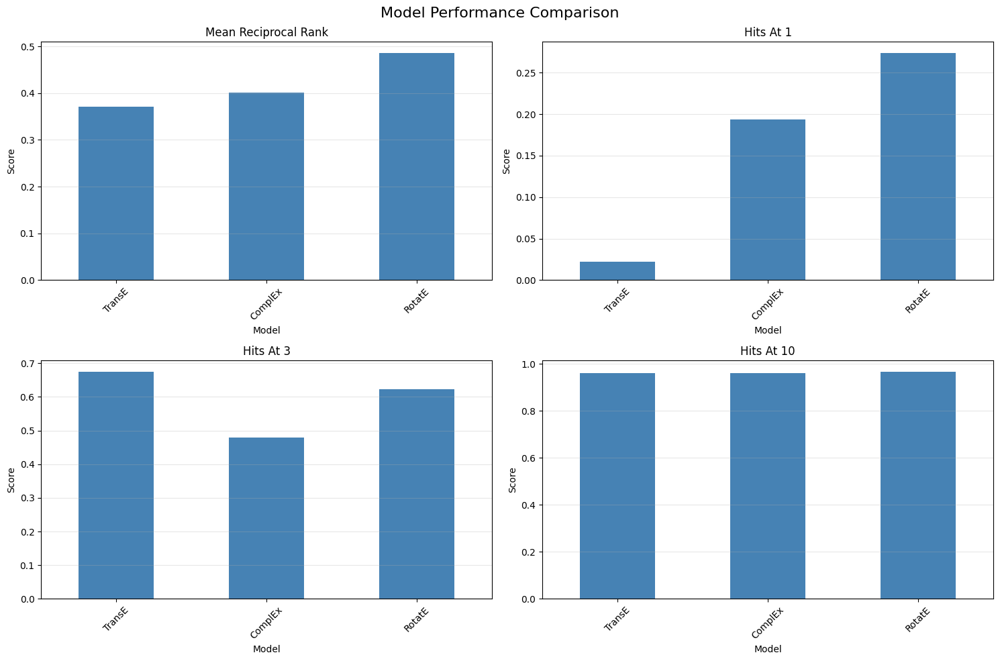

[I 2026-01-07 13:24:05,470] A new study created in memory with name: no-name-87b886f7-93ee-41fb-a017-ca73adfd677f
INFO:pykeen.hpo.hpo:Using model: <class 'pykeen.models.unimodal.trans_e.TransE'>
INFO:pykeen.hpo.hpo:Using loss: <class 'pykeen.losses.MarginRankingLoss'>
INFO:pykeen.hpo.hpo:Using optimizer: <class 'torch.optim.adam.Adam'>
INFO:pykeen.hpo.hpo:Using training loop: <class 'pykeen.training.slcwa.SLCWATrainingLoop'>
INFO:pykeen.hpo.hpo:Using negative sampler: <class 'pykeen.sampling.basic_negative_sampler.BasicNegativeSampler'>
INFO:pykeen.hpo.hpo:Using evaluator: <class 'pykeen.evaluation.rank_based_evaluator.RankBasedEvaluator'>
INFO:pykeen.hpo.hpo:Attempting to maximize both.realistic.inverse_harmonic_mean_rank
INFO:pykeen.hpo.hpo:Filter validation triples when testing: True
INFO:pykeen.pipeline.api:Using device: cpu
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()



SECTION 5: Hyperparameter Optimization



Training epochs on cpu:   0%|          | 0/50 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Evaluating on cpu:   0%|          | 0.00/199 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.13s seconds
[I 2026-01-07 13:24:36,530] Trial 0 finished with value: 0.4003303647041321 and parameters: {'model.embedding_dim': 48, 'model.scoring_fct_norm': 2, 'loss.margin': 0.28352259160168447, 'optimizer.lr': 0.03312876323819079, 'negative_sampler.num_negs_per_pos': 1, 'training.batch_size': 4096}. Best is trial 0 with value: 0.4003303647041321.
INFO:pykeen.pipeline.api:Using device: cpu
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()


Training epochs on cpu:   0%|          | 0/50 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Evaluating on cpu:   0%|          | 0.00/199 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.14s seconds
[I 2026-01-07 13:25:32,971] Trial 1 finished with value: 0.4091755747795105 and parameters: {'model.embedding_dim': 224, 'model.scoring_fct_norm': 2, 'loss.margin': 2.3728637737839824, 'optimizer.lr': 0.059370895273954824, 'negative_sampler.num_negs_per_pos': 31, 'training.batch_size': 16}. Best is trial 1 with value: 0.4091755747795105.
INFO:pykeen.pipeline.api:Using device: cpu
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()


Training epochs on cpu:   0%|          | 0/50 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/13.0 [00:00<?, ?batch/s]

Evaluating on cpu:   0%|          | 0.00/199 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.13s seconds
[I 2026-01-07 13:26:07,952] Trial 2 finished with value: 0.41960668563842773 and parameters: {'model.embedding_dim': 240, 'model.scoring_fct_norm': 2, 'loss.margin': 1.5276763736929753, 'optimizer.lr': 0.08486263240443721, 'negative_sampler.num_negs_per_pos': 2, 'training.batch_size': 128}. Best is trial 2 with value: 0.41960668563842773.
INFO:pykeen.pipeline.api:Using device: cpu
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()


Training epochs on cpu:   0%|          | 0/50 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/2.00 [00:00<?, ?batch/s]

Evaluating on cpu:   0%|          | 0.00/199 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.16s seconds
[I 2026-01-07 13:26:41,756] Trial 3 finished with value: 0.43627646565437317 and parameters: {'model.embedding_dim': 112, 'model.scoring_fct_norm': 1, 'loss.margin': 1.4832878198442057, 'optimizer.lr': 0.09886415838110335, 'negative_sampler.num_negs_per_pos': 8, 'training.batch_size': 1024}. Best is trial 3 with value: 0.43627646565437317.
INFO:pykeen.pipeline.api:Using device: cpu
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()


Training epochs on cpu:   0%|          | 0/50 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/7.00 [00:00<?, ?batch/s]

Evaluating on cpu:   0%|          | 0.00/199 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.12s seconds
[I 2026-01-07 13:27:34,484] Trial 4 finished with value: 0.4420824348926544 and parameters: {'model.embedding_dim': 176, 'model.scoring_fct_norm': 1, 'loss.margin': 0.8634948780122815, 'optimizer.lr': 0.07240255255987949, 'negative_sampler.num_negs_per_pos': 69, 'training.batch_size': 256}. Best is trial 4 with value: 0.4420824348926544.
INFO:pykeen.pipeline.api:Using device: cpu
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()


Training epochs on cpu:   0%|          | 0/50 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Evaluating on cpu:   0%|          | 0.00/199 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.13s seconds
[I 2026-01-07 13:28:11,501] Trial 5 finished with value: 0.41433581709861755 and parameters: {'model.embedding_dim': 192, 'model.scoring_fct_norm': 2, 'loss.margin': 2.5641688333141763, 'optimizer.lr': 0.038256114692164056, 'negative_sampler.num_negs_per_pos': 12, 'training.batch_size': 4096}. Best is trial 4 with value: 0.4420824348926544.
INFO:pykeen.pipeline.api:Using device: cpu
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()


Training epochs on cpu:   0%|          | 0/50 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/50.0 [00:00<?, ?batch/s]

Evaluating on cpu:   0%|          | 0.00/199 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.13s seconds
[I 2026-01-07 13:29:11,709] Trial 6 finished with value: 0.4343492090702057 and parameters: {'model.embedding_dim': 160, 'model.scoring_fct_norm': 1, 'loss.margin': 2.3833159998898594, 'optimizer.lr': 0.046762968302581163, 'negative_sampler.num_negs_per_pos': 82, 'training.batch_size': 32}. Best is trial 4 with value: 0.4420824348926544.
INFO:pykeen.pipeline.api:Using device: cpu
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()


Training epochs on cpu:   0%|          | 0/50 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Evaluating on cpu:   0%|          | 0.00/199 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.13s seconds
[I 2026-01-07 13:29:45,912] Trial 7 finished with value: 0.2805859446525574 and parameters: {'model.embedding_dim': 16, 'model.scoring_fct_norm': 1, 'loss.margin': 1.9334609748750222, 'optimizer.lr': 0.003051227669079642, 'negative_sampler.num_negs_per_pos': 1, 'training.batch_size': 4096}. Best is trial 4 with value: 0.4420824348926544.
INFO:pykeen.pipeline.api:Using device: cpu
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()


Training epochs on cpu:   0%|          | 0/50 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/4.00 [00:00<?, ?batch/s]

Evaluating on cpu:   0%|          | 0.00/199 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.12s seconds
[I 2026-01-07 13:30:22,215] Trial 8 finished with value: 0.4183697998523712 and parameters: {'model.embedding_dim': 16, 'model.scoring_fct_norm': 2, 'loss.margin': 2.1414721706111672, 'optimizer.lr': 0.022173629215565108, 'negative_sampler.num_negs_per_pos': 1, 'training.batch_size': 512}. Best is trial 4 with value: 0.4420824348926544.
INFO:pykeen.pipeline.api:Using device: cpu
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()


Training epochs on cpu:   0%|          | 0/50 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/100 [00:00<?, ?batch/s]

Evaluating on cpu:   0%|          | 0.00/199 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.16s seconds
[I 2026-01-07 13:31:17,300] Trial 9 finished with value: 0.42733144760131836 and parameters: {'model.embedding_dim': 16, 'model.scoring_fct_norm': 2, 'loss.margin': 2.227497732919025, 'optimizer.lr': 0.05544281165606594, 'negative_sampler.num_negs_per_pos': 57, 'training.batch_size': 16}. Best is trial 4 with value: 0.4420824348926544.



Best Configuration Found:
  Embedding Dim: 176
  Learning Rate: 0.07240255255987949
  Best MRR: 0.4421

SECTION 6: Link Prediction

Using RotatE for predictions

Top predictions for: brazil --[accusation]--> ?
  1. uk (score: -2.6192)
  2. usa (score: -2.7376)
  3. india (score: -2.9970)
  4. netherlands (score: -3.0322)
  5. ussr (score: -3.1207)

SECTION 7: Model Interpretation

Entity embeddings shape: torch.Size([14, 50])
Embedding dtype: torch.complex64
Detected complex embeddings - converting to real representation
Converted embeddings shape: (14, 100)

Entities most similar to 'brazil':
  1. israel (similarity: 0.2967)
  2. egypt (similarity: 0.2665)
  3. burma (similarity: 0.1113)
  4. netherlands (similarity: 0.0592)
  5. india (similarity: 0.0583)


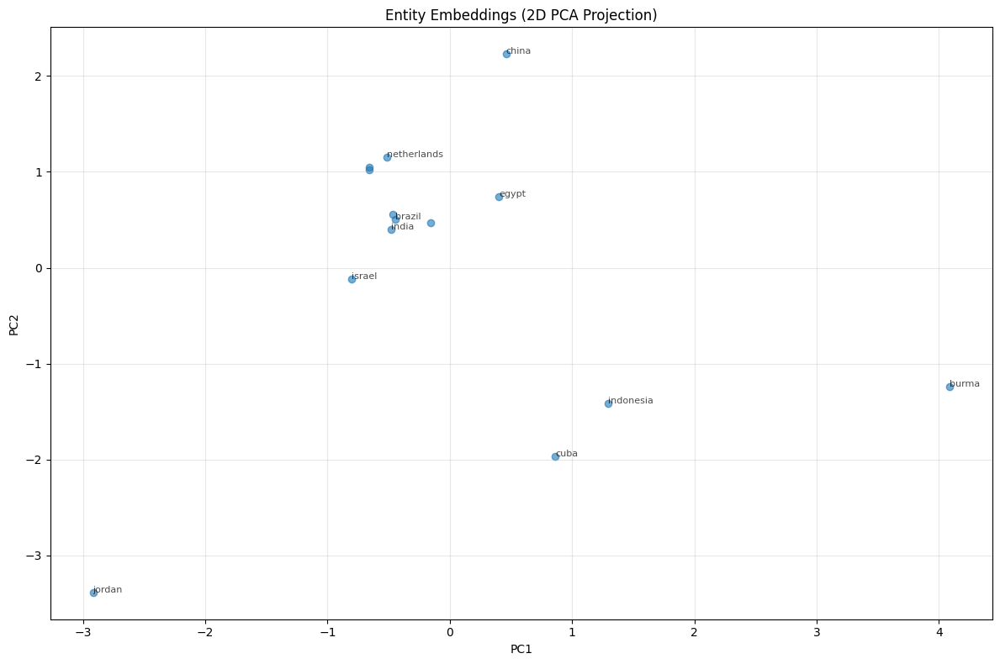


TUTORIAL SUMMARY


Key Takeaways:
1. PyKEEN provides easy-to-use pipelines for KG embeddings
2. Multiple models can be compared with minimal code
3. Hyperparameter optimization improves performance
4. Models can predict missing links in knowledge graphs
5. Embeddings capture semantic relationships
6. Always use filtered evaluation for fair comparison
7. Consider multiple metrics (MRR, Hits@K)

Next Steps:
- Try different models (ConvE, TuckER, etc.)
- Use larger datasets (FB15k-237, WN18RR)
- Implement custom loss functions
- Experiment with relation prediction
- Use your own knowledge graph data

For more information, visit: https://pykeen.readthedocs.io


✓ Tutorial Complete!


In [6]:
print("\n" + "="*80)
print("SECTION 7: Model Interpretation")
print("="*80 + "\n")

entity_embeddings = model.entity_representations[0]()
entity_embeddings_tensor = entity_embeddings.detach().cpu()

print(f"Entity embeddings shape: {entity_embeddings_tensor.shape}")
print(f"Embedding dtype: {entity_embeddings_tensor.dtype}")

if entity_embeddings_tensor.is_complex():
    print("Detected complex embeddings - converting to real representation")
    entity_embeddings_np = np.concatenate([
        entity_embeddings_tensor.real.numpy(),
        entity_embeddings_tensor.imag.numpy()
    ], axis=1)
    print(f"Converted embeddings shape: {entity_embeddings_np.shape}")
else:
    entity_embeddings_np = entity_embeddings_tensor.numpy()

from sklearn.metrics.pairwise import cosine_similarity

similarity_matrix = cosine_similarity(entity_embeddings_np)

def find_similar_entities(entity_label: str, top_k: int = 5):
    """Find most similar entities based on embedding similarity."""
    entity_id = dataset.training.entity_to_id[entity_label]
    similarities = similarity_matrix[entity_id]

    similar_indices = np.argsort(similarities)[::-1][1:top_k+1]

    similar_entities = []
    for idx in similar_indices:
        label = dataset.training.entity_id_to_label[idx]
        similarity = similarities[idx]
        similar_entities.append((label, similarity))

    return similar_entities

if dataset.training.num_entities > 5:
    example_entity = list(dataset.entity_to_id.keys())[0]
    print(f"\nEntities most similar to '{example_entity}':")
    similar = find_similar_entities(example_entity, top_k=5)
    for rank, (entity, sim) in enumerate(similar, 1):
        print(f"  {rank}. {entity} (similarity: {sim:.4f})")

from sklearn.decomposition import PCA

pca = PCA(n_components=2)
embeddings_2d = pca.fit_transform(entity_embeddings_np)

plt.figure(figsize=(12, 8))
plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], alpha=0.6)

num_labels = min(10, len(dataset.training.entity_id_to_label))
for i in range(num_labels):
    label = dataset.training.entity_id_to_label[i]
    plt.annotate(label, (embeddings_2d[i, 0], embeddings_2d[i, 1]),
                fontsize=8, alpha=0.7)

plt.title('Entity Embeddings (2D PCA Projection)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print("\n" + "="*80)
print("TUTORIAL SUMMARY")
print("="*80 + "\n")

print("""
Key Takeaways:
1. PyKEEN provides easy-to-use pipelines for KG embeddings
2. Multiple models can be compared with minimal code
3. Hyperparameter optimization improves performance
4. Models can predict missing links in knowledge graphs
5. Embeddings capture semantic relationships
6. Always use filtered evaluation for fair comparison
7. Consider multiple metrics (MRR, Hits@K)

Next Steps:
- Try different models (ConvE, TuckER, etc.)
- Use larger datasets (FB15k-237, WN18RR)
- Implement custom loss functions
- Experiment with relation prediction
- Use your own knowledge graph data

For more information, visit: https://pykeen.readthedocs.io
""")

print("\n✓ Tutorial Complete!")